<a href="https://colab.research.google.com/github/RifatRudro/Data-Science-Work/blob/main/Solar_Panel_Extended.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import keras
from tqdm import tqdm
from keras.callbacks import EarlyStopping,ModelCheckpoint
from sklearn.metrics import confusion_matrix , accuracy_score
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')

In [ ]:
#Create Files_Name
image_data='/content/drive/MyDrive/Solar Panel/Faulty_solar_panel'
pd.DataFrame(os.listdir(image_data),columns=['Files_Name'])

,Files_Name
0,Clean
1,Snow-Covered
2,Electrical-damage
3,Physical-Damage
4,Dusty
5,Bird-drop


In [17]:
train_data_dir =image_data
batch_size = 32
target_size = (224,224)
validation_split = 0.2
train= tf.keras.preprocessing.image_dataset_from_directory(
    train_data_dir,
    validation_split=validation_split,
    subset="training",
    seed=100,
    image_size=target_size,
    batch_size=batch_size,
)
validation= tf.keras.preprocessing.image_dataset_from_directory(
    train_data_dir,
    validation_split=validation_split,
    subset="validation",
    seed=200,
    image_size=target_size,
    batch_size=batch_size,
)

Found 895 files belonging to 6 classes.
Using 716 files for training.
Found 895 files belonging to 6 classes.
Using 179 files for validation.


In [18]:
class_names = train.class_names
class_names

['Bird-drop',
 'Clean',
 'Dusty',
 'Electrical-damage',
 'Physical-Damage',
 'Snow-Covered']

In [19]:
def class_distribution(dataset, class_names):

  class_counts = {}
  for images, labels in dataset:
    for label in labels.numpy():
      class_name = class_names[label]
      if class_name not in class_counts:
        class_counts[class_name] = 0
      class_counts[class_name] += 1

  df = pd.DataFrame(list(class_counts.items()), columns=['Class', 'Count'])
  return df

# Calculate and print class distributions for each dataset
train_class_distribution = class_distribution(train, class_names)
print("Training Set Class Distribution:")
print(train_class_distribution)

validation_class_distribution = class_distribution(validation, class_names)
print("\nValidation Set Class Distribution:")
print(validation_class_distribution)

test_class_distribution = class_distribution(test, class_names)
print("\nTest Set Class Distribution:")
test_class_distribution

Training Set Class Distribution:
               Class  Count
0  Electrical-damage     81
1          Bird-drop    164
2       Snow-Covered    102
3              Clean    164
4              Dusty    151
5    Physical-Damage     54

Validation Set Class Distribution:
               Class  Count
0          Bird-drop     49
1       Snow-Covered     26
2              Clean     42
3              Dusty     30
4  Electrical-damage     20
5    Physical-Damage     12

Test Set Class Distribution:


,Class,Count
0,Bird-drop,49
1,Dusty,30
2,Electrical-damage,20
3,Clean,42
4,Snow-Covered,26
5,Physical-Damage,12


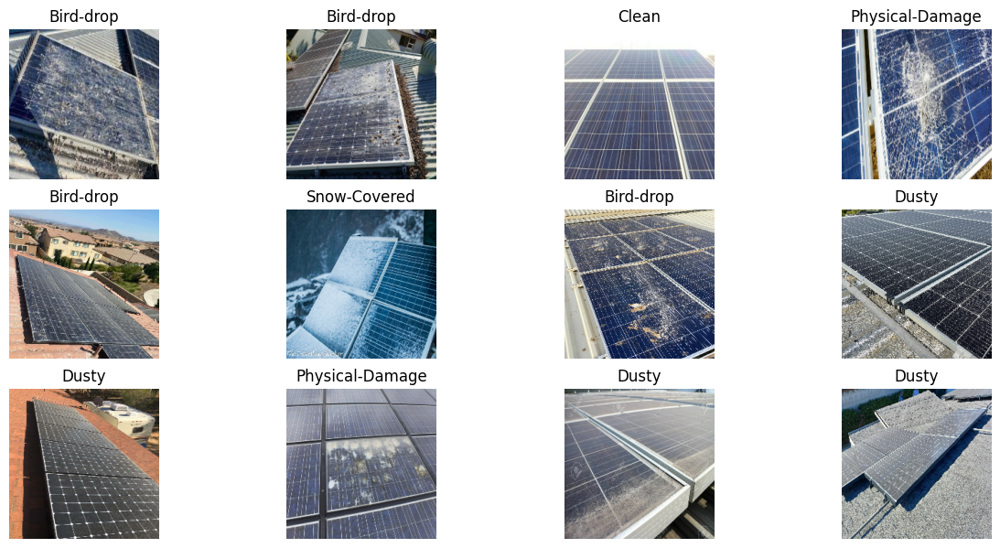

In [20]:
plt.figure(figsize=(15, 20))
for images, labels in train.take(1):
    for i in range(12):
        ax = plt.subplot(8, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [52]:
base_model = tf.keras.applications.MobileNetV3Large(input_shape=(224,224,3),include_top=False,weights='imagenet')
base_model.trainable = False
keras_model=keras.models.Sequential()
keras_model.add(base_model)
keras_model.add(keras.layers.Flatten())
keras_model.add(keras.layers.Dropout(0.5))
keras_model.add(keras.layers.Dense(512,activation=tf.nn.softmax))

# Build the model by calling it with a dummy input
keras_model.build(input_shape=(None, 224, 224, 3)) # This line is added

keras_model.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ MobileNetV3Large (Functional)        │ (None, 7, 7, 960)           │       2,996,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_8 (Flatten)                  │ (None, 47040)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 47040)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 512)                 │      24,084,992 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 27,081,344 (103.31 MB)

 Trainable params: 24,084,992 (91.88 MB)

 Non-trainable params: 2,996,352 (11.43 MB)

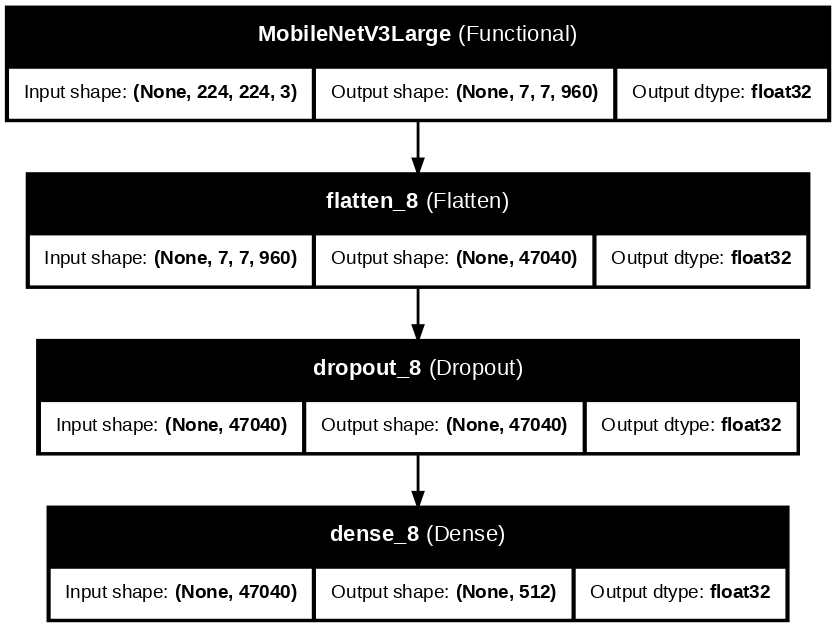

In [55]:
tf.keras.utils.plot_model(keras_model, to_file='model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=100)

In [56]:
checkpoint = ModelCheckpoint("my_keras_model.keras", save_best_only=True) # Changed the file extension to .keras

In [57]:
early_stopping =EarlyStopping(patience=5, restore_best_weights=True)

In [60]:
keras_model.compile(optimizer ='adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])
# Replace fit_generator with fit, which now supports generators
hist = keras_model.fit(train, epochs=10, validation_data=validation, callbacks=[checkpoint, early_stopping])

Epoch 1/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 86s 3s/step - accuracy: 0.5305 - loss: 3.0507 - val_accuracy: 0.9106 - val_loss: 0.5334
Epoch 2/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 70s 3s/step - accuracy: 0.9393 - loss: 0.3284 - val_accuracy: 0.9609 - val_loss: 0.4010
Epoch 3/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 72s 2s/step - accuracy: 0.9745 - loss: 0.1085 - val_accuracy: 0.9497 - val_loss: 0.4181
Epoch 4/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 82s 3s/step - accuracy: 0.9718 - loss: 0.0974 - val_accuracy: 0.9497 - val_loss: 0.4387
Epoch 5/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 87s 3s/step - accuracy: 0.9926 - loss: 0.0191 - val_accuracy: 0.9721 - val_loss: 0.3804
Epoch 6/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - accuracy: 0.9902 - loss: 0.0417 - val_accuracy: 0.9609 - val_loss: 0.3662
Epoch 7/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 59s 3s/step - accuracy: 0.9913 - loss: 0.0236 - val_accuracy: 0.9665 - val_loss: 0.4798
Epoch 8/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 68s 3s/step - accuracy: 0.9909 - loss: 0.0426 - val_accuracy: 0.9553 - val_loss:

In [62]:
hist_=pd.DataFrame(hist.history)
hist_

,accuracy,loss,val_accuracy,val_loss
0,0.617318,2.722279,0.910615,0.533379
1,0.937151,0.333803,0.960894,0.400984
2,0.973464,0.099896,0.949721,0.418099
3,0.973464,0.094677,0.949721,0.438692
4,0.988827,0.024397,0.972067,0.380442
5,0.990223,0.044955,0.960894,0.366206
6,0.991620,0.032712,0.966480,0.479804
7,0.993017,0.037394,0.955307,0.573339
8,0.993017,0.041483,0.966480,0.477455
9,0.997207,0.003525,0.966480,0.455626


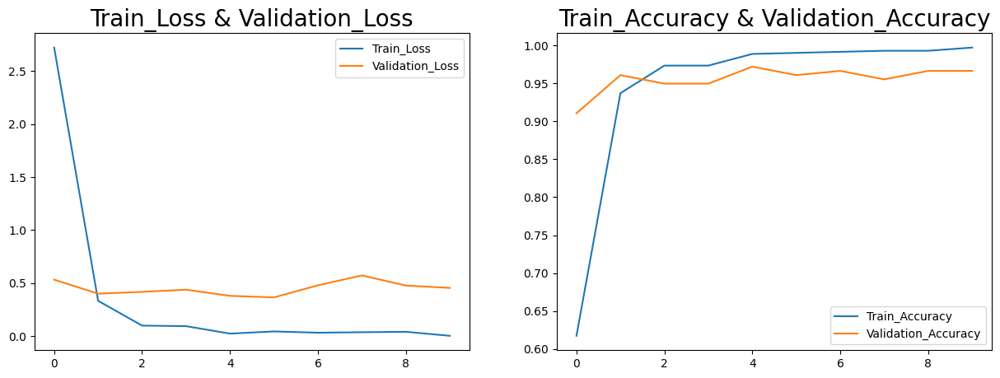

In [63]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()

In [64]:
X_val,y_val,y_pred=[],[],[]
for images, labels in validation:
    y_val.extend(labels.numpy())
    X_val.extend(images.numpy())
predictions=keras_model.predict(np.array(X_val))
for i in predictions:
    y_pred.append(np.argmax(i))
df=pd.DataFrame()
df['Actual'],df['Prediction']=y_val,y_pred
df

6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step


,Actual,Prediction
0,0,0
1,0,0
2,2,2
3,4,4
4,4,4
...,...,...
174,1,1
175,0,0
176,0,0
177,5,5


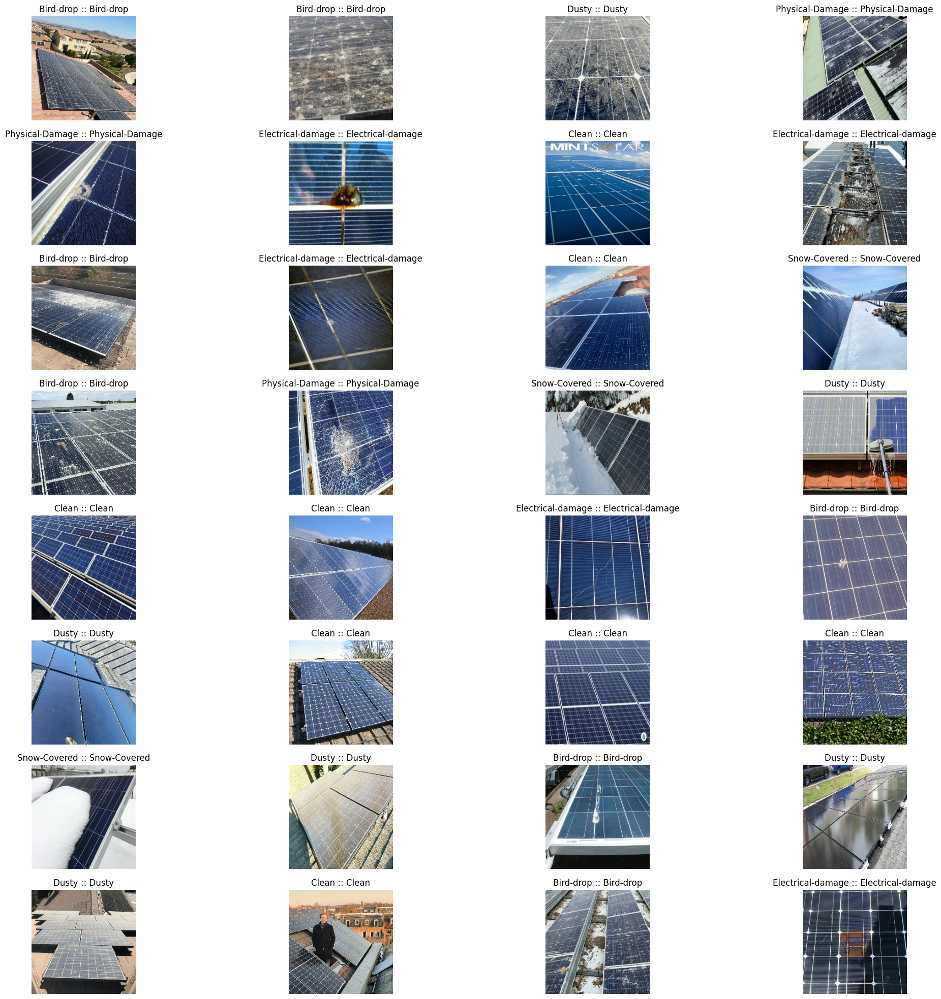

In [65]:
plt.figure(figsize=(25,25))
for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(X_val[i].astype("uint8"))
    plt.title(f'{class_names[y_val[i]]} :: {class_names[y_pred[i]]}')
    plt.axis("off")

Accuracy on Validation Set: 0.9608938547486033


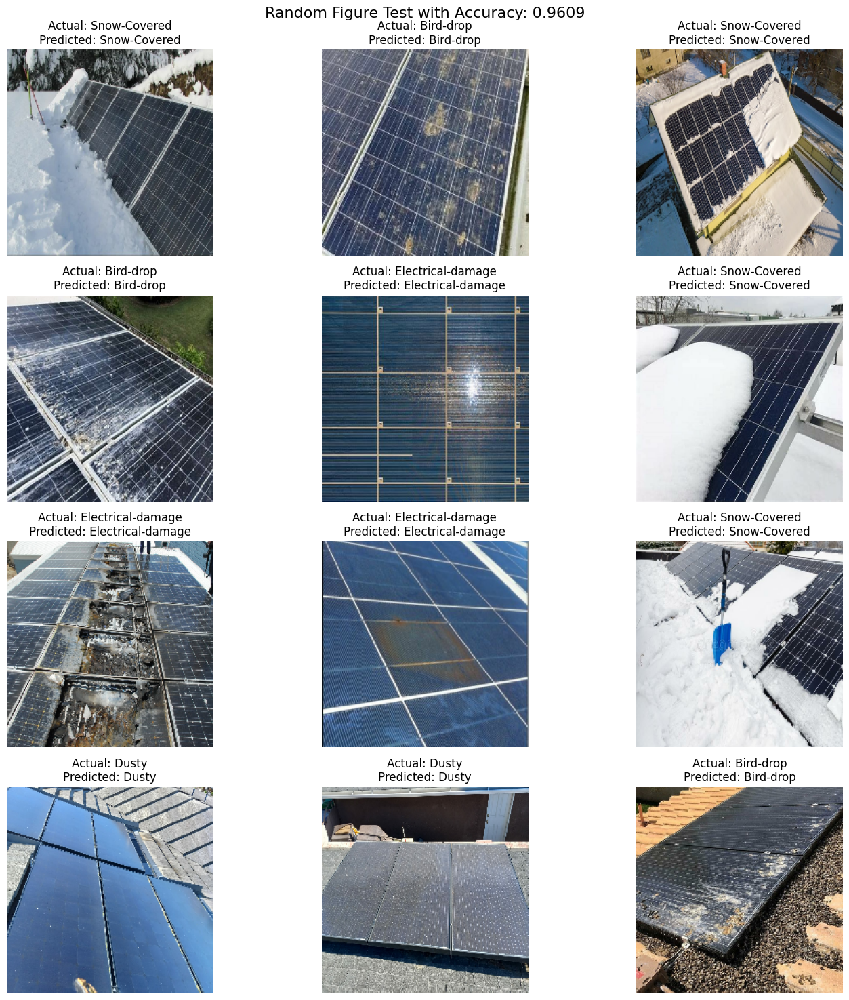

In [77]:
from sklearn.metrics import accuracy_score


# Assuming you have y_val and y_pred defined from your validation dataset
accuracy = accuracy_score(y_val, y_pred)
print(f"Accuracy on Validation Set: {accuracy}")

# Plotting random figures with class labels and accuracy
plt.figure(figsize=(15, 15))
for i in range(12):  # Display 12 random figures
    random_index = np.random.randint(0, len(X_val))
    ax = plt.subplot(4, 3, i + 1)
    plt.imshow(X_val[random_index].astype("uint8"))
    plt.title(f"Actual: {class_names[y_val[random_index]]}\nPredicted: {class_names[y_pred[random_index]]}")
    plt.axis("off")

plt.suptitle(f"Random Figure Test with Accuracy: {accuracy:.4f}", fontsize=16)  # Add accuracy to the title
plt.tight_layout()
plt.show()

In [78]:
Acc = accuracy_score(y_val,y_pred)
print("accuracy is: {0:.3f}%".format(Acc * 100))

accuracy is: 96.089%


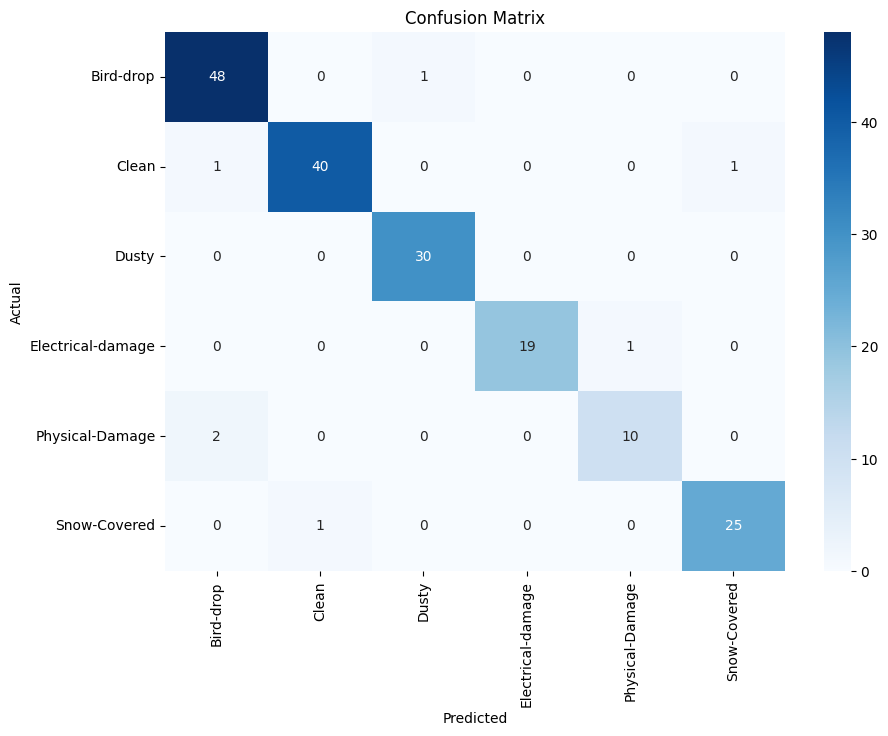

In [79]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the confusion matrix
cm = confusion_matrix(y_val, y_pred)

# Create a heatmap of the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

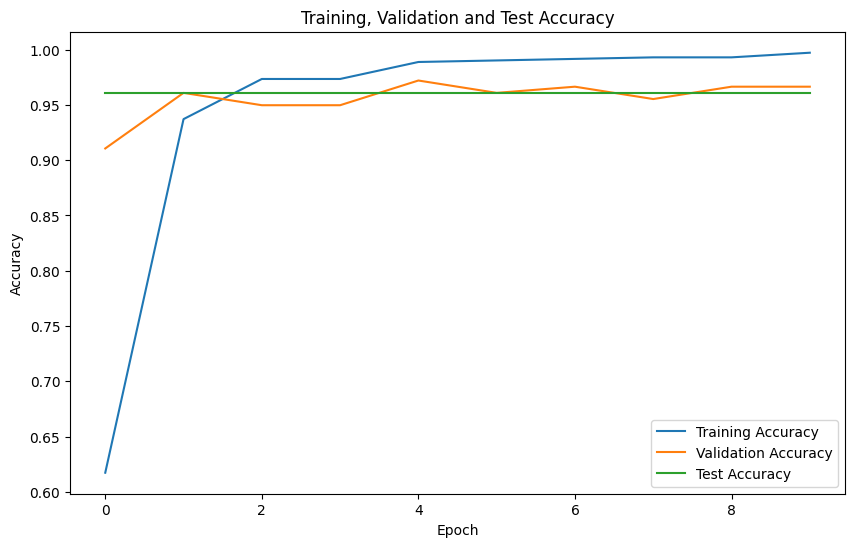

In [80]:
plt.figure(figsize=(10, 6))
plt.plot(hist.history['accuracy'], label='Training Accuracy')
plt.plot(hist.history['val_accuracy'], label='Validation Accuracy')
plt.plot([Acc] * len(hist.history['accuracy']), label='Test Accuracy')
plt.title('Training, Validation and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [81]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Load the pre-trained MobileNetV3 base model without the top layer
base_model = tf.keras.applications.MobileNetV3Large(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
base_model.trainable = False  # Freeze the base model layers

# Build the custom model
model = models.Sequential([
    base_model,  # Add MobileNetV3 as a feature extractor
    layers.GlobalAveragePooling2D(),  # Use global average pooling instead of Flatten for better generalization
    layers.BatchNormalization(),  # Optional: Batch normalization to stabilize training
    layers.Dropout(0.5),  # Regularization through dropout
    layers.Dense(512, activation='relu'),  # Change activation to ReLU for non-linearity
    layers.Dense(10, activation='softmax')  # Output layer with 10 classes, change as needed
])

# Build the model by calling it with a dummy input (Optional, based on your framework version)
model.build(input_shape=(None, 224, 224, 3))

# Show model summary
model.summary()


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ MobileNetV3Large (Functional)        │ (None, 7, 7, 960)           │       2,996,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 960)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 960)                 │           3,840 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 960)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 512)                 │         492,032 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 10)                  │           5,130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,497,354 (13.34 MB)

 Trainable params: 499,082 (1.90 MB)

 Non-trainable params: 2,998,272 (11.44 MB)

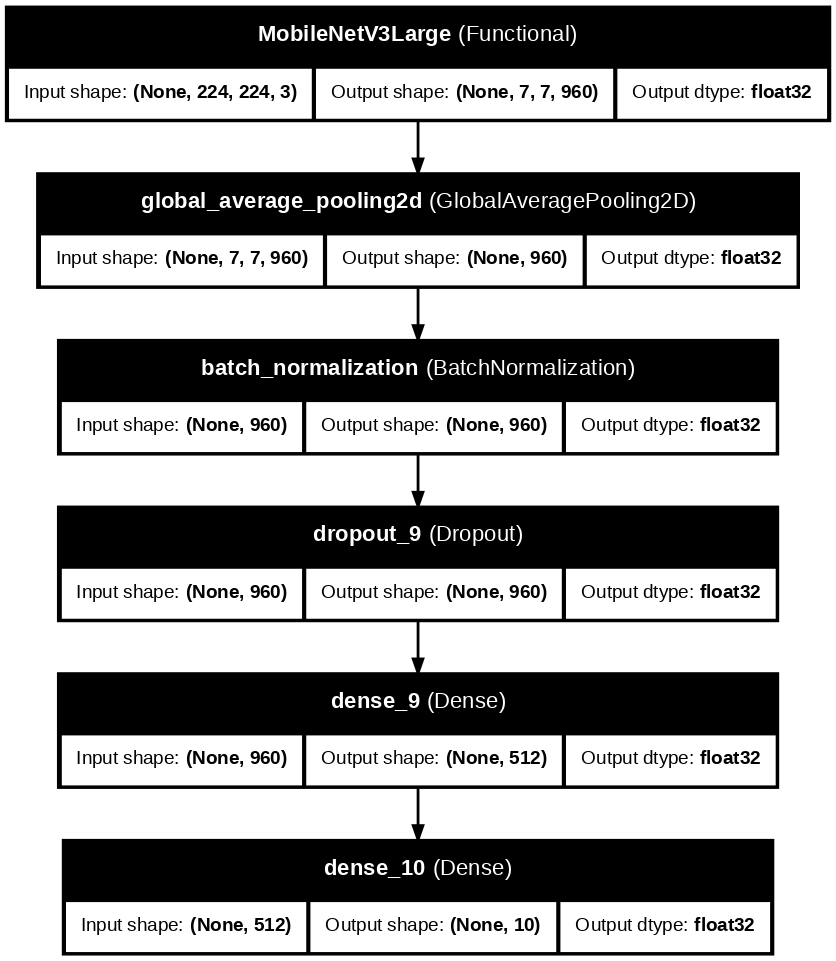

In [83]:
# Plot the model
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, show_dtype=True, dpi=100)

In [85]:
# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Define the checkpoint callback
checkpoint = ModelCheckpoint("my_keras_model.keras",
                             save_best_only=True,    # Save the model only when it's the best
                             monitor='val_loss',     # Monitor validation loss
                             mode='min',             # Save when validation loss is minimized
                             verbose=1)              # Print a message when saving the model

# Train the model with the checkpoint callback
keras_model.compile(optimizer ='adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])
# Replace fit_generator with fit, which now supports generators
hist = keras_model.fit(train, epochs=10, validation_data=validation, callbacks=[checkpoint, early_stopping])

Epoch 1/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9940 - loss: 0.0355
Epoch 1: val_loss improved from inf to 0.44989, saving model to my_keras_model.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 88s 3s/step - accuracy: 0.9940 - loss: 0.0355 - val_accuracy: 0.9665 - val_loss: 0.4499
Epoch 2/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9988 - loss: 0.0043
Epoch 2: val_loss did not improve from 0.44989
23/23 ━━━━━━━━━━━━━━━━━━━━ 65s 3s/step - accuracy: 0.9987 - loss: 0.0046 - val_accuracy: 0.9497 - val_loss: 0.6713
Epoch 3/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9818 - loss: 0.0732
Epoch 3: val_loss did not improve from 0.44989
23/23 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - accuracy: 0.9819 - loss: 0.0731 - val_accuracy: 0.9553 - val_loss: 0.6947
Epoch 4/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9932 - loss: 0.0244
Epoch 4: val_loss did not improve from 0.44989
23/23 ━━━━━━━━━━━━━━━━━━━━ 90s 3s/step - accuracy: 0.9933 - loss: 0.0241 - val_accuracy: 0.9665 -

In [86]:
hist_=pd.DataFrame(hist.history)
hist_

,accuracy,loss,val_accuracy,val_loss
0,0.994413,0.035675,0.966480,0.449890
1,0.997207,0.010903,0.949721,0.671328
2,0.986033,0.070806,0.955307,0.694670
3,0.995810,0.017224,0.966480,0.643331
4,0.994413,0.019617,0.966480,0.837854


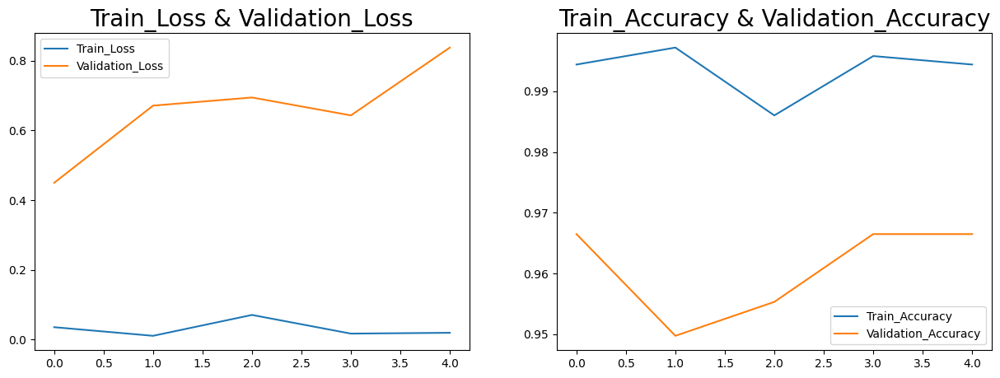

In [87]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()

In [88]:
X_val,y_val,y_pred=[],[],[]
for images, labels in validation:
    y_val.extend(labels.numpy())
    X_val.extend(images.numpy())
predictions=keras_model.predict(np.array(X_val))
for i in predictions:
    y_pred.append(np.argmax(i))
df=pd.DataFrame()
df['Actual'],df['Prediction']=y_val,y_pred
df

6/6 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step


,Actual,Prediction
0,1,1
1,1,1
2,2,2
3,1,1
4,1,1
...,...,...
174,2,2
175,0,0
176,2,2
177,1,1


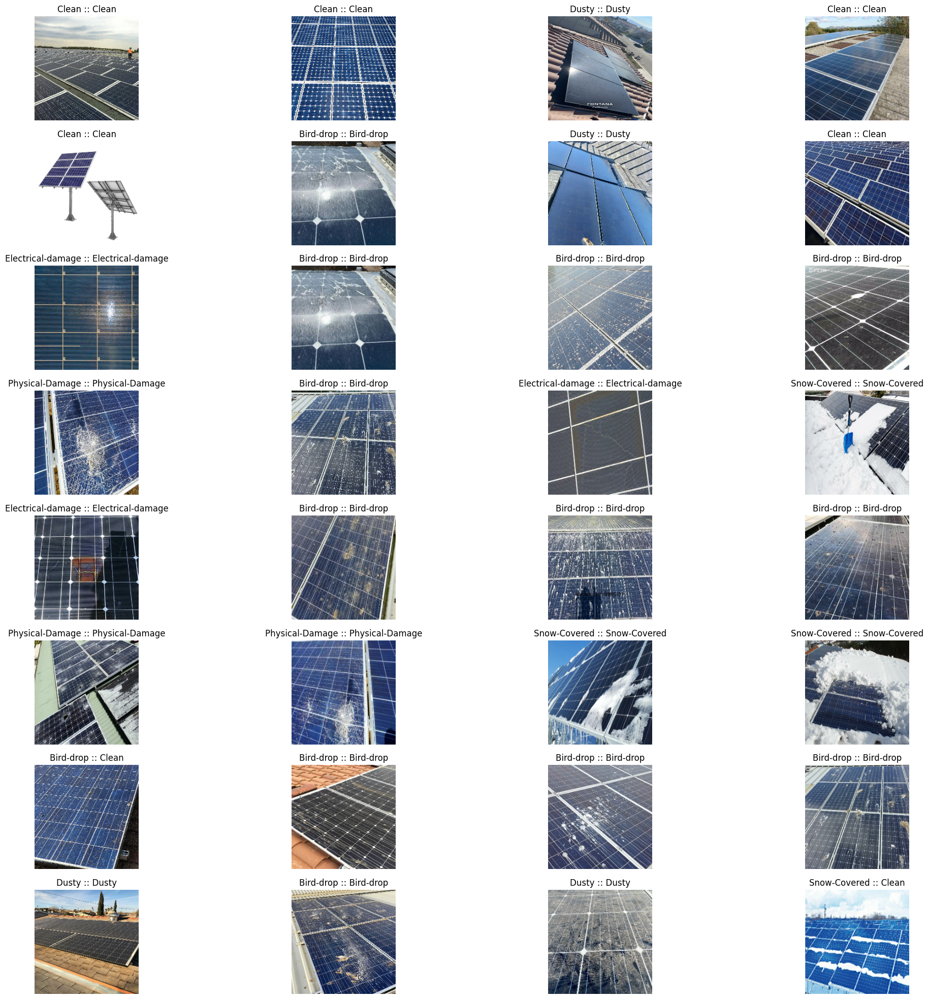

In [89]:
plt.figure(figsize=(25,25))
for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(X_val[i].astype("uint8"))
    plt.title(f'{class_names[y_val[i]]} :: {class_names[y_pred[i]]}')
    plt.axis("off")

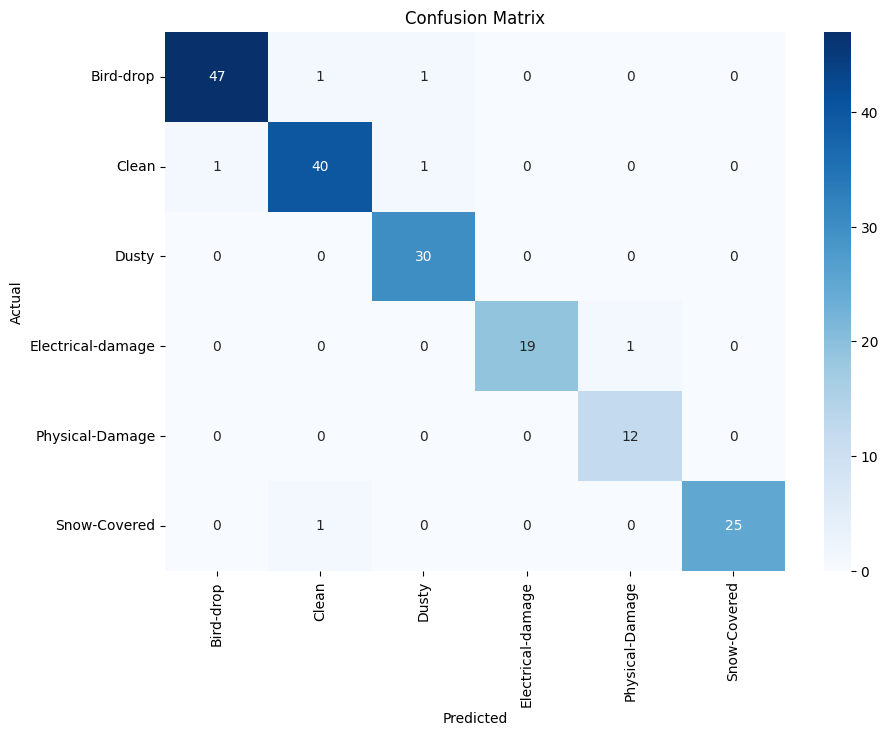

In [90]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the confusion matrix
cm = confusion_matrix(y_val, y_pred)

# Create a heatmap of the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

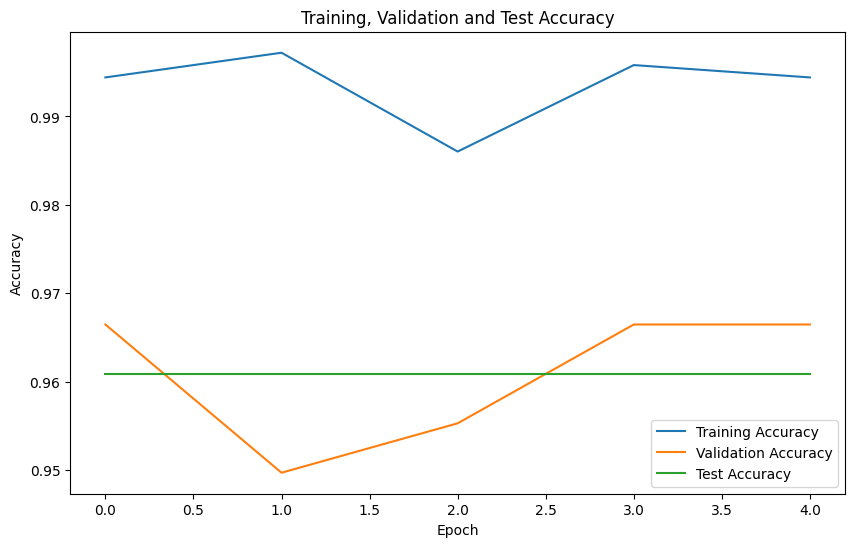

In [91]:
plt.figure(figsize=(10, 6))
plt.plot(hist.history['accuracy'], label='Training Accuracy')
plt.plot(hist.history['val_accuracy'], label='Validation Accuracy')
plt.plot([Acc] * len(hist.history['accuracy']), label='Test Accuracy')
plt.title('Training, Validation and Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

Accuracy on Validation Set: 0.9664804469273743


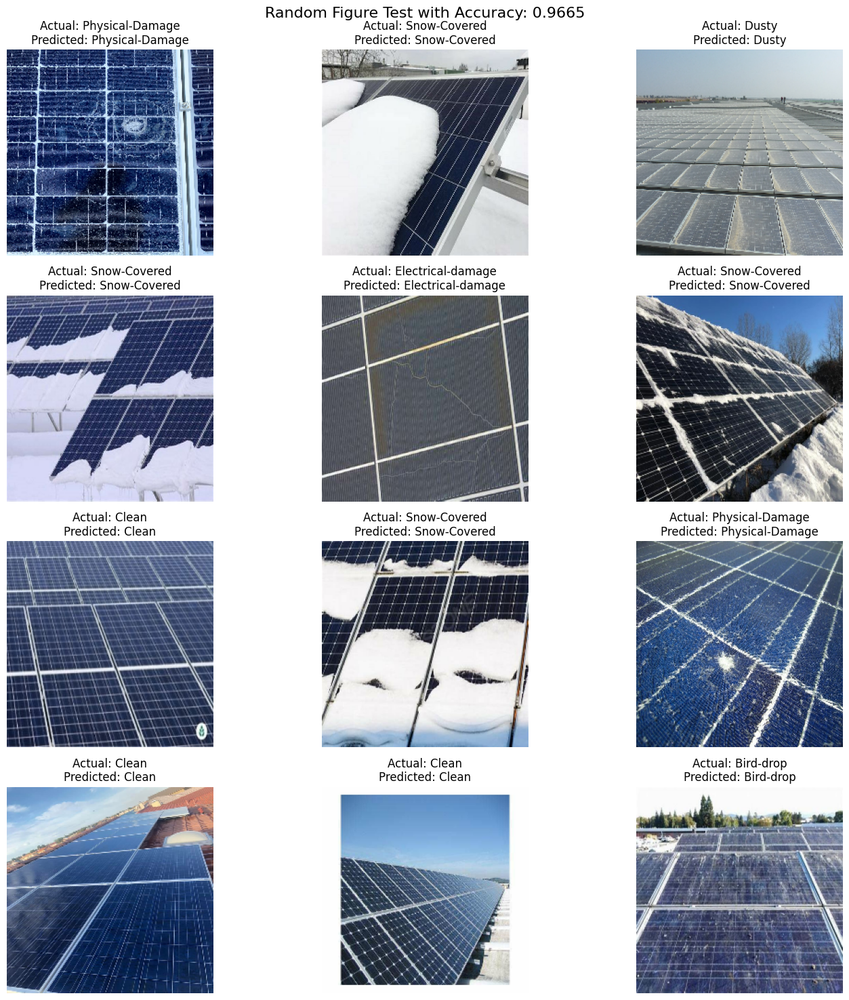

In [92]:
from sklearn.metrics import accuracy_score


# Assuming you have y_val and y_pred defined from your validation dataset
accuracy = accuracy_score(y_val, y_pred)
print(f"Accuracy on Validation Set: {accuracy}")

# Plotting random figures with class labels and accuracy
plt.figure(figsize=(15, 15))
for i in range(12):  # Display 12 random figures
    random_index = np.random.randint(0, len(X_val))
    ax = plt.subplot(4, 3, i + 1)
    plt.imshow(X_val[random_index].astype("uint8"))
    plt.title(f"Actual: {class_names[y_val[random_index]]}\nPredicted: {class_names[y_pred[random_index]]}")
    plt.axis("off")

plt.suptitle(f"Random Figure Test with Accuracy: {accuracy:.4f}", fontsize=16)  # Add accuracy to the title
plt.tight_layout()
plt.show()